<a href="https://colab.research.google.com/github/qorganbek/ComputerVision-Spring-2024/blob/main/object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np

np.random.seed(42)

In [ ]:
import torch

def yolo2bbox(bboxes):
    xmin = bboxes[0] - bboxes[2] / 2
    ymin = bboxes[1] - bboxes[3] / 2
    xmax = bboxes[0] + bboxes[2] / 2
    ymax = bboxes[1] + bboxes[3] / 2
    return xmin, ymin, xmax, ymax

# Example usage:
# bboxes = torch.tensor


In [ ]:
import torch
import numpy as np
import cv2

class_names = ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    bboxes = bboxes.cpu().numpy()  # Convert to numpy array if it's a PyTorch tensor
    labels = labels.cpu().numpy()  # Convert to numpy array if it's a PyTorch tensor
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)

        # denormalize the coordinates
        xmin = int(x1 * w)
        ymin = int(y1 * h)
        xmax = int(x2 * w)
        ymax = int(y2 * h)
        width = xmax - xmin
        height = ymax - ymin
        class_name = class_names[int(labels[box_num])]

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color=colors[class_names.index(class_name)],
            thickness=2
        )

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))

        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
         # Text width and height
        tw, th = cv2.getTextSize(class_name, 0, fontScale=font_scale, thickness=font_thickness)[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        cv2.rectangle(
            image,
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1,
        )
        cv2.putText(
            image,
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image


In [ ]:
import glob
import random
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()

    num_images = len(all_training_images)
    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0, num_images - 1)
        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = int(label_line[0])  # Convert label to int
                bbox_string = label_line[2:]
                x_c, y_c, w, h = map(float, bbox_string.split(' '))
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
            result_image = plot_box(image, torch.tensor(bboxes), torch.tensor(labels))  # Use torch.tensor to convert bboxes and labels
        plt.subplot(2, 2, i + 1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()


Mounted at /content/drive


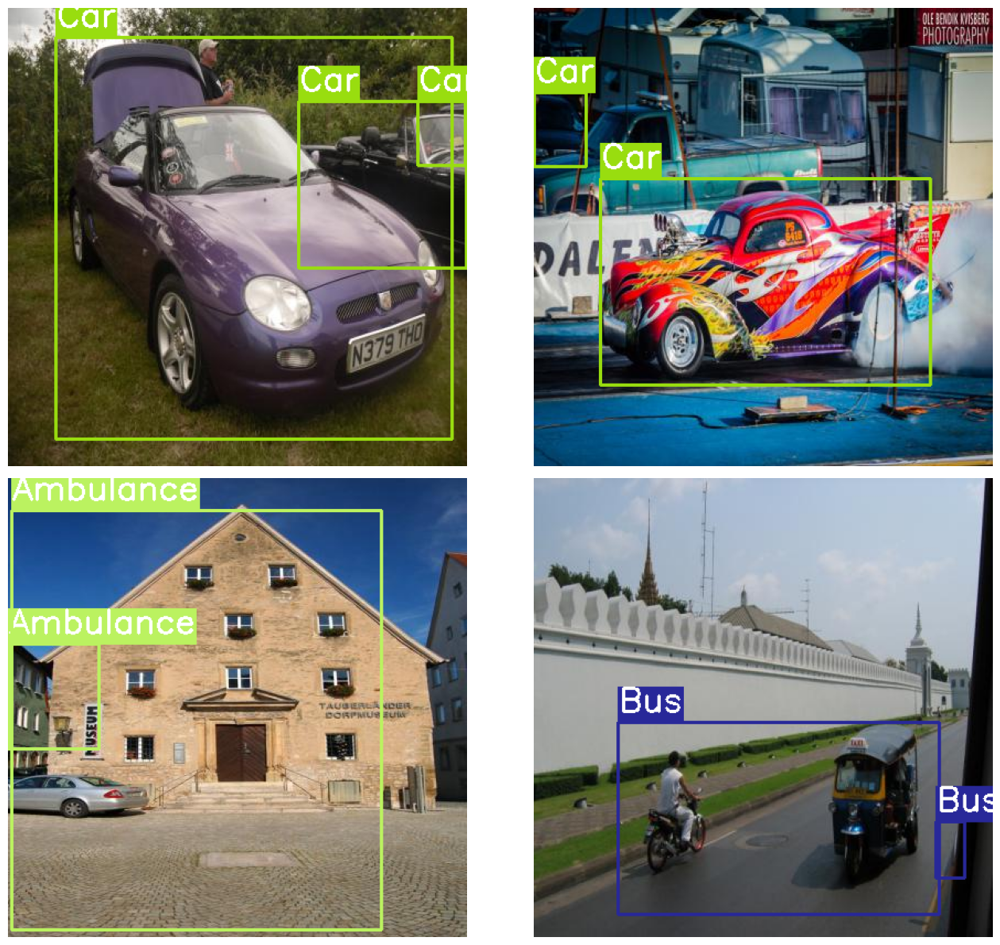

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
image_paths = '/content/drive/MyDrive/LAB5/Cars Detection/train/images/*'
label_paths = '/content/drive/MyDrive/LAB5/Cars Detection/train/labels/*'

plot(image_paths, label_paths, num_samples=4)

In [ ]:
!pip install ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.4/750.4 kB 10.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-man

In [ ]:
import os

from ultralytics import YOLO


# Load a model
model = YOLO("yolov5n.yaml")  # build a new model from scratch

In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16530, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 16530 (delta 1), reused 5 (delta 0), pack-reused 16522
Receiving objects: 100% (16530/16530), 15.07 MiB | 18.57 MiB/s, done.
Resolving deltas: 100% (11358/11358), done.


In [ ]:
%cd yolov5/models
!ls


/content/yolov5/models
common.py	 hub	      segment  yolo.py	     yolov5m.yaml  yolov5s.yaml
experimental.py  __init__.py  tf.py    yolov5l.yaml  yolov5n.yaml  yolov5x.yaml


In [ ]:
# Use the model
results = model.train(data="/content/drive/MyDrive/LAB5/Cars Detection/data.yaml", epochs=100)  # train the model


Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov5n.yaml, data=/content/drive/MyDrive/LAB5/Cars Detection/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_label

100%|██████████| 755k/755k [00:00<00:00, 25.1MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1      1760  ultralytics.nn.modules.conv.Conv             [3, 16, 6, 2, 2]              
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      4800  ultralytics.nn.modules.block.C3              [32, 32, 1]                   
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     29184  ultralytics.nn.modules.block.C3              [64, 64, 2]                   
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  3    156928  ultralytics.nn.modules.block.C3              [128, 128, 3]                 
  7                  -1  1    295424  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 126MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/.shortcut-targets-by-id/14YW5P2Rvh1xClY_hfSWlCZ5scLP0bugk/LAB5/Cars Detection/train/labels... 878 images, 0 backgrounds, 0 corrupt: 100%|██████████| 878/878 [08:58<00:00,  1.63it/s]


train: New cache created: /content/drive/.shortcut-targets-by-id/14YW5P2Rvh1xClY_hfSWlCZ5scLP0bugk/LAB5/Cars Detection/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/.shortcut-targets-by-id/14YW5P2Rvh1xClY_hfSWlCZ5scLP0bugk/LAB5/Cars Detection/valid/labels... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [04:02<00:00,  1.03it/s]


val: New cache created: /content/drive/.shortcut-targets-by-id/14YW5P2Rvh1xClY_hfSWlCZ5scLP0bugk/LAB5/Cars Detection/valid/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.39G      3.228      4.378      4.223         52        640: 100%|██████████| 55/55 [00:27<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.67it/s]

                   all        250        454    0.00207      0.427    0.00167   0.000684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.22G      3.206       4.29      4.043         56        640: 100%|██████████| 55/55 [00:23<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.29it/s]

                   all        250        454    0.00246      0.494     0.0028    0.00104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.24G      3.043      4.158      3.706         56        640: 100%|██████████| 55/55 [00:23<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.11it/s]

                   all        250        454    0.00514     0.0486    0.00639    0.00181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.22G       2.91      4.124       3.47         45        640: 100%|██████████| 55/55 [00:22<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:06<00:00,  1.27it/s]

                   all        250        454    0.00274      0.127    0.00528    0.00116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.23G      2.829      4.031      3.335         37        640: 100%|██████████| 55/55 [00:23<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.47it/s]

                   all        250        454      0.401     0.0538    0.00218   0.000614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.21G      2.751      3.937      3.252         57        640: 100%|██████████| 55/55 [00:23<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.91it/s]

                   all        250        454    0.00859      0.104     0.0133    0.00369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.19G      2.666      3.855      3.183         61        640: 100%|██████████| 55/55 [00:23<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.29it/s]

                   all        250        454    0.00396       0.72     0.0275    0.00816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.17G      2.539      3.795      3.067         58        640: 100%|██████████| 55/55 [00:23<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.95it/s]

                   all        250        454     0.0108      0.598     0.0392     0.0111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.19G       2.47      3.731      2.979         52        640: 100%|██████████| 55/55 [00:22<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.58it/s]

                   all        250        454      0.231      0.088     0.0272    0.00698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.22G      2.384       3.66       2.92         59        640: 100%|██████████| 55/55 [00:21<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.44it/s]

                   all        250        454       0.27     0.0982     0.0635     0.0244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100       2.2G       2.28      3.599      2.828         62        640: 100%|██████████| 55/55 [00:21<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.52it/s]

                   all        250        454      0.315      0.179     0.0587     0.0254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.19G      2.251      3.549      2.766         48        640: 100%|██████████| 55/55 [00:21<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.25it/s]


                   all        250        454      0.151      0.122     0.0666     0.0291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.22G        2.2       3.48      2.708         39        640: 100%|██████████| 55/55 [00:22<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.10it/s]

                   all        250        454     0.0991      0.161     0.0878     0.0381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.21G      2.146      3.389      2.661         58        640: 100%|██████████| 55/55 [00:23<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.29it/s]

                   all        250        454      0.286      0.159     0.0877     0.0375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100       2.2G      2.097      3.349      2.628         49        640: 100%|██████████| 55/55 [00:23<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.30it/s]

                   all        250        454      0.319      0.183     0.0985     0.0478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.23G      2.048      3.287      2.581         49        640: 100%|██████████| 55/55 [00:23<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.27it/s]

                   all        250        454      0.337      0.149      0.111     0.0518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100       2.2G      2.008      3.231      2.521         37        640: 100%|██████████| 55/55 [00:23<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.12it/s]

                   all        250        454      0.155      0.124      0.119     0.0551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       2.2G      1.968      3.155      2.473         41        640: 100%|██████████| 55/55 [00:23<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.47it/s]

                   all        250        454      0.121      0.203      0.136     0.0677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.22G      1.945      3.127      2.466         51        640: 100%|██████████| 55/55 [00:23<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.09it/s]

                   all        250        454      0.365      0.153      0.119     0.0528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       2.2G      1.928      3.063      2.437         48        640: 100%|██████████| 55/55 [00:22<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]

                   all        250        454      0.232      0.248      0.177     0.0902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100       2.2G      1.897      3.013      2.391         50        640: 100%|██████████| 55/55 [00:21<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.44it/s]

                   all        250        454      0.238      0.243      0.171     0.0963



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.22G      1.864      2.954      2.364         40        640: 100%|██████████| 55/55 [00:21<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.94it/s]


                   all        250        454      0.228      0.233      0.137     0.0605

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100       2.2G       1.86      2.919      2.335         44        640: 100%|██████████| 55/55 [00:22<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.25it/s]

                   all        250        454      0.208      0.251      0.188      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100       2.2G       1.83      2.902       2.32         39        640: 100%|██████████| 55/55 [00:22<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.25it/s]

                   all        250        454      0.361      0.228       0.18     0.0841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100       2.2G      1.813       2.88      2.297         56        640: 100%|██████████| 55/55 [00:23<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.22it/s]

                   all        250        454       0.25      0.302      0.214      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.19G      1.784      2.845      2.275         54        640: 100%|██████████| 55/55 [00:23<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.07it/s]

                   all        250        454      0.268      0.285      0.169     0.0936



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       2.2G      1.775      2.798      2.246         54        640: 100%|██████████| 55/55 [00:23<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.29it/s]

                   all        250        454       0.25       0.28      0.194      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100       2.2G      1.753      2.752      2.233         45        640: 100%|██████████| 55/55 [00:23<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.35it/s]

                   all        250        454      0.295      0.279      0.227      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.22G      1.738      2.738       2.22         44        640: 100%|██████████| 55/55 [00:23<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.51it/s]

                   all        250        454      0.279        0.3       0.21      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.19G      1.727      2.729      2.201         70        640: 100%|██████████| 55/55 [00:23<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.09it/s]

                   all        250        454      0.185      0.265       0.19      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100       2.2G      1.705       2.68      2.157         53        640: 100%|██████████| 55/55 [00:23<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.22it/s]

                   all        250        454      0.258      0.317      0.214      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.17G      1.708      2.631      2.167         69        640: 100%|██████████| 55/55 [00:23<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.52it/s]

                   all        250        454      0.335       0.29      0.271      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.19G      1.655      2.636      2.131         45        640: 100%|██████████| 55/55 [00:23<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.02it/s]

                   all        250        454       0.27      0.302      0.229      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.19G      1.667      2.588      2.134         58        640: 100%|██████████| 55/55 [00:22<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.94it/s]

                   all        250        454      0.235      0.327      0.212      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.19G      1.651      2.554      2.111         66        640: 100%|██████████| 55/55 [00:22<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.82it/s]

                   all        250        454      0.279      0.343      0.236      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100       2.2G      1.649      2.535      2.108         57        640: 100%|██████████| 55/55 [00:21<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.62it/s]

                   all        250        454      0.256      0.344      0.224      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.19G      1.639      2.502      2.092         59        640: 100%|██████████| 55/55 [00:21<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.44it/s]

                   all        250        454      0.359      0.333      0.224      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.19G      1.625      2.512      2.081         52        640: 100%|██████████| 55/55 [00:23<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.67it/s]

                   all        250        454      0.286      0.359      0.243      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100       2.2G      1.632      2.458      2.086         70        640: 100%|██████████| 55/55 [00:22<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.56it/s]

                   all        250        454      0.349      0.289       0.26      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100       2.2G      1.627      2.453       2.09         72        640: 100%|██████████| 55/55 [00:22<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.58it/s]

                   all        250        454      0.334      0.382      0.277      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100       2.2G      1.592      2.435      2.046         40        640: 100%|██████████| 55/55 [00:21<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.47it/s]

                   all        250        454      0.326       0.33      0.268      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.19G      1.577      2.417      2.049         38        640: 100%|██████████| 55/55 [00:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.68it/s]

                   all        250        454      0.388      0.386      0.319       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100       2.2G      1.556      2.373      2.008         40        640: 100%|██████████| 55/55 [00:21<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.94it/s]

                   all        250        454       0.41      0.307      0.312      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100       2.2G       1.55      2.337      2.001         52        640: 100%|██████████| 55/55 [00:21<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.24it/s]

                   all        250        454      0.361       0.34      0.279      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.19G      1.552      2.364      2.033         45        640: 100%|██████████| 55/55 [00:22<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.21it/s]


                   all        250        454       0.28       0.39      0.254      0.144

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.22G      1.536      2.328      1.986         50        640: 100%|██████████| 55/55 [00:21<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.15it/s]

                   all        250        454      0.374      0.371      0.255      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.21G      1.504      2.283      1.972         98        640: 100%|██████████| 55/55 [00:22<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.28it/s]

                   all        250        454      0.332      0.371      0.276      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100       2.2G      1.538      2.297      1.986         43        640: 100%|██████████| 55/55 [00:22<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.06it/s]

                   all        250        454      0.499      0.326      0.274      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.19G      1.508      2.265      1.963         64        640: 100%|██████████| 55/55 [00:23<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.25it/s]

                   all        250        454      0.345      0.338      0.307      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100       2.2G      1.535      2.274      2.006         48        640: 100%|██████████| 55/55 [00:22<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.34it/s]

                   all        250        454      0.477      0.338      0.311      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.19G      1.494      2.254       1.96         35        640: 100%|██████████| 55/55 [00:23<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.35it/s]

                   all        250        454      0.327      0.389      0.304      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.19G      1.489      2.199      1.924         54        640: 100%|██████████| 55/55 [00:23<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.56it/s]

                   all        250        454      0.356       0.37      0.336      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.17G      1.485      2.219      1.937         70        640: 100%|██████████| 55/55 [00:22<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.14it/s]

                   all        250        454      0.463      0.347      0.367      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.19G       1.48      2.177      1.915         49        640: 100%|██████████| 55/55 [00:22<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.17it/s]

                   all        250        454      0.428      0.348      0.339      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.23G       1.49      2.197      1.927         58        640: 100%|██████████| 55/55 [00:23<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.35it/s]

                   all        250        454      0.333      0.434      0.312      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100       2.2G      1.491      2.192      1.931         48        640: 100%|██████████| 55/55 [00:22<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.38it/s]

                   all        250        454      0.398      0.399      0.379      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.19G      1.445      2.134      1.896         49        640: 100%|██████████| 55/55 [00:22<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]

                   all        250        454      0.325      0.454      0.359      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.19G      1.471      2.139      1.931         52        640: 100%|██████████| 55/55 [00:22<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.93it/s]

                   all        250        454      0.333      0.475      0.298      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.19G      1.446      2.135      1.903         54        640: 100%|██████████| 55/55 [00:21<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.75it/s]

                   all        250        454      0.327      0.448      0.308      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.19G      1.417      2.115      1.875         50        640: 100%|██████████| 55/55 [00:21<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.61it/s]

                   all        250        454      0.355      0.436      0.349       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.19G      1.431      2.077      1.887         51        640: 100%|██████████| 55/55 [00:22<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.57it/s]

                   all        250        454      0.317      0.451      0.357      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100       2.2G       1.42      2.101      1.874         50        640: 100%|██████████| 55/55 [00:21<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.37it/s]

                   all        250        454      0.324       0.41      0.329      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.19G      1.417      2.072      1.872         54        640: 100%|██████████| 55/55 [00:21<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.71it/s]

                   all        250        454      0.377      0.483      0.339      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100       2.2G      1.404      2.077      1.869         56        640: 100%|██████████| 55/55 [00:21<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.06it/s]

                   all        250        454       0.32      0.479      0.345      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.19G      1.381      2.017      1.835         44        640: 100%|██████████| 55/55 [00:21<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]

                   all        250        454       0.32      0.447      0.327      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100       2.2G      1.376      1.996      1.824         53        640: 100%|██████████| 55/55 [00:22<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.22it/s]

                   all        250        454      0.407      0.424      0.368      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.19G      1.402      2.053      1.847         49        640: 100%|██████████| 55/55 [00:22<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.19it/s]

                   all        250        454      0.396      0.417       0.37      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100       2.2G      1.372      1.975      1.821         43        640: 100%|██████████| 55/55 [00:22<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.23it/s]

                   all        250        454      0.414      0.413      0.375      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.19G      1.374      2.011      1.838         49        640: 100%|██████████| 55/55 [00:22<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.72it/s]

                   all        250        454      0.372       0.48      0.375      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100       2.2G      1.368      1.953      1.822         50        640: 100%|██████████| 55/55 [00:23<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.18it/s]

                   all        250        454      0.339       0.45      0.392      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.19G      1.385      1.969      1.836         56        640: 100%|██████████| 55/55 [00:22<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.28it/s]

                   all        250        454      0.461      0.422        0.4      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.17G      1.338      1.936      1.791         50        640: 100%|██████████| 55/55 [00:22<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.35it/s]

                   all        250        454       0.45      0.462      0.428      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.21G      1.376      1.935      1.823         34        640: 100%|██████████| 55/55 [00:23<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.42it/s]

                   all        250        454       0.45      0.428       0.39      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.22G      1.346      1.939      1.803         54        640: 100%|██████████| 55/55 [00:23<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.18it/s]

                   all        250        454      0.495      0.425      0.427      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100       2.2G      1.337      1.912      1.798         41        640: 100%|██████████| 55/55 [00:23<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.36it/s]

                   all        250        454      0.421      0.437      0.398      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.19G      1.371       1.96      1.818         55        640: 100%|██████████| 55/55 [00:23<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.31it/s]

                   all        250        454      0.455      0.426      0.412      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100       2.2G      1.322      1.865      1.775         47        640: 100%|██████████| 55/55 [00:23<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.28it/s]

                   all        250        454      0.476      0.401      0.406      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.21G      1.325      1.889      1.786         56        640: 100%|██████████| 55/55 [00:22<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.29it/s]

                   all        250        454      0.453      0.496      0.446      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.19G       1.33      1.889      1.782         63        640: 100%|██████████| 55/55 [00:22<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.34it/s]

                   all        250        454      0.422      0.472      0.408      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.17G      1.272      1.818      1.747         68        640: 100%|██████████| 55/55 [00:23<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.56it/s]

                   all        250        454      0.505       0.43      0.431      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.19G      1.307      1.812      1.758         48        640: 100%|██████████| 55/55 [00:23<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.52it/s]

                   all        250        454      0.419      0.509      0.421      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.19G      1.322      1.833       1.77         40        640: 100%|██████████| 55/55 [00:23<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.40it/s]

                   all        250        454      0.435      0.502      0.424       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.19G      1.292        1.8      1.751         53        640: 100%|██████████| 55/55 [00:21<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.84it/s]

                   all        250        454      0.486      0.511       0.43      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.19G      1.299       1.81      1.773         43        640: 100%|██████████| 55/55 [00:21<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.40it/s]

                   all        250        454      0.464      0.425      0.418      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.19G      1.272      1.776      1.731         53        640: 100%|██████████| 55/55 [00:21<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.60it/s]

                   all        250        454       0.47      0.471      0.445      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.17G       1.28      1.784      1.738         44        640: 100%|██████████| 55/55 [00:21<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.76it/s]

                   all        250        454        0.5       0.46       0.46      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.19G      1.252      1.756      1.712         35        640: 100%|██████████| 55/55 [00:21<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.98it/s]

                   all        250        454      0.497      0.509      0.452      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100       2.2G      1.269      1.765      1.739         54        640: 100%|██████████| 55/55 [00:21<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.23it/s]

                   all        250        454      0.516      0.469      0.461       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.19G      1.264      1.745      1.722         38        640: 100%|██████████| 55/55 [00:22<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.48it/s]

                   all        250        454      0.524      0.467      0.463      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.19G      1.266      1.739      1.714         43        640: 100%|██████████| 55/55 [00:22<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.32it/s]

                   all        250        454      0.528       0.49      0.452      0.298


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.35G      1.155      1.611      1.672         26        640: 100%|██████████| 55/55 [00:23<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.45it/s]

                   all        250        454      0.528      0.474      0.466      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.17G      1.138      1.532      1.657         20        640: 100%|██████████| 55/55 [00:21<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.55it/s]

                   all        250        454      0.449      0.484       0.45      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.19G      1.122      1.492      1.648         27        640: 100%|██████████| 55/55 [00:21<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.41it/s]

                   all        250        454      0.542       0.45      0.457      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.17G       1.11      1.436      1.621         28        640: 100%|██████████| 55/55 [00:22<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.57it/s]

                   all        250        454      0.492      0.467      0.442      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.19G       1.11       1.43      1.637         23        640: 100%|██████████| 55/55 [00:20<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.87it/s]

                   all        250        454      0.513      0.523      0.477      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.17G        1.1      1.429      1.624         23        640: 100%|██████████| 55/55 [00:20<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.85it/s]

                   all        250        454       0.57      0.477      0.472      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.17G      1.086      1.427      1.614         18        640: 100%|██████████| 55/55 [00:20<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.13it/s]

                   all        250        454      0.541      0.442      0.462      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.19G      1.081      1.394       1.61         28        640: 100%|██████████| 55/55 [00:20<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.39it/s]

                   all        250        454      0.467      0.503      0.466      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.17G      1.103      1.397      1.617         20        640: 100%|██████████| 55/55 [00:21<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.61it/s]

                   all        250        454      0.489      0.471      0.463      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.18G      1.086        1.4      1.608         18        640: 100%|██████████| 55/55 [00:21<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.38it/s]

                   all        250        454      0.496      0.484      0.476      0.318



100 epochs completed in 0.767 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv5n summary (fused): 193 layers, 2503919 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:07<00:00,  1.10it/s]


                   all        250        454      0.495       0.49      0.475      0.318
             Ambulance        250         64      0.726       0.75      0.752      0.566
                   Bus        250         46      0.509      0.541       0.54      0.413
                   Car        250        238      0.473      0.387      0.364       0.24
            Motorcycle        250         46      0.373      0.439      0.435      0.212
                 Truck        250         60      0.397      0.333      0.283      0.158
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms loss, 5.3ms postprocess per image
Results saved to runs/detect/train


In [ ]:
metrics = model.val()

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/drive/.shortcut-targets-by-id/14YW5P2Rvh1xClY_hfSWlCZ5scLP0bugk/LAB5/Cars Detection/valid/labels.cache... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.77it/s]


                   all        250        454      0.499       0.49      0.477      0.319
             Ambulance        250         64      0.728      0.751      0.753      0.566
                   Bus        250         46      0.509       0.54       0.54      0.416
                   Car        250        238      0.473      0.387      0.364      0.238
            Motorcycle        250         46      0.372      0.438      0.434      0.212
                 Truck        250         60      0.415      0.333      0.295      0.165
Speed: 0.8ms preprocess, 9.8ms inference, 0.0ms loss, 4.9ms postprocess per image
Results saved to runs/detect/train3


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os

# Define the directory to search in
search_dir = 'runs/detect/train3/'  # Update this with the directory where the model output is saved

# Walk through the directory and its subdirectories
for root, dirs, files in os.walk(search_dir):
    print(root)
    print(dirs)
    print(files)
    for file in files:
        print(file)
%cd detect
# !ls


runs/detect/train3/
[]
['val_batch2_labels.jpg', 'val_batch1_labels.jpg', 'val_batch2_pred.jpg', 'confusion_matrix_normalized.png', 'val_batch0_pred.jpg', 'F1_curve.png', 'P_curve.png', 'val_batch0_labels.jpg', 'confusion_matrix.png', 'val_batch1_pred.jpg', 'PR_curve.png', 'R_curve.png']
val_batch2_labels.jpg
val_batch1_labels.jpg
val_batch2_pred.jpg
confusion_matrix_normalized.png
val_batch0_pred.jpg
F1_curve.png
P_curve.png
val_batch0_labels.jpg
confusion_matrix.png
val_batch1_pred.jpg
PR_curve.png
R_curve.png
[Errno 2] No such file or directory: 'detect'
/content/yolov5/models


In [ ]:
import locale
locale.getpreferredencoding = lambda: 'UTF-8'

!yolo task=detect mode=predict model=/content/yolov5/models/runs/detect/train/weights/best.pt source='/content/drive/MyDrive/LAB5/Cars Detection/test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg'


Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv5n summary (fused): 193 layers, 2503919 parameters, 0 gradients, 7.1 GFLOPs

image 1/1 /content/drive/MyDrive/LAB5/Cars Detection/test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg: 640x640 1 Ambulance, 1 Truck, 7.9ms
Speed: 4.1ms preprocess, 7.9ms inference, 2224.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


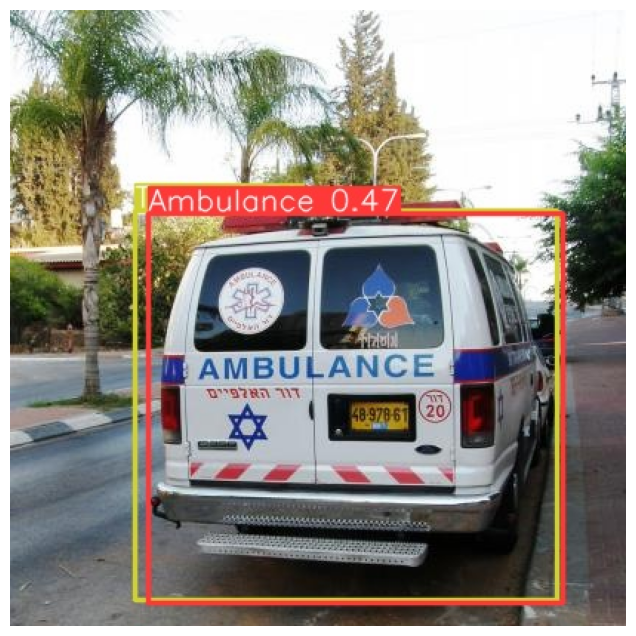

In [ ]:
img_path = '/content/yolov5/models/runs/detect/predict/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg'
img = plt.imread(img_path)

plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis(False)
plt.show()

VIDEO

In [ ]:
!yolo task=detect mode=predict model=/content/yolov5/models/runs/detect/train/weights/best.pt source='/content/drive/MyDrive/LAB5/input.mp4'

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv5n summary (fused): 193 layers, 2503919 parameters, 0 gradients, 7.1 GFLOPs

video 1/1 (frame 1/1462) /content/drive/MyDrive/LAB5/input.mp4: 384x640 3 Cars, 1 Truck, 104.4ms
video 1/1 (frame 2/1462) /content/drive/MyDrive/LAB5/input.mp4: 384x640 3 Cars, 1 Truck, 9.0ms
video 1/1 (frame 3/1462) /content/drive/MyDrive/LAB5/input.mp4: 384x640 2 Cars, 1 Truck, 7.4ms
video 1/1 (frame 4/1462) /content/drive/MyDrive/LAB5/input.mp4: 384x640 2 Cars, 1 Truck, 7.2ms
video 1/1 (frame 5/1462) /content/drive/MyDrive/LAB5/input.mp4: 384x640 3 Cars, 1 Truck, 7.1ms
video 1/1 (frame 6/1462) /content/drive/MyDrive/LAB5/input.mp4: 384x640 3 Cars, 1 Truck, 7.1ms
video 1/1 (frame 7/1462) /content/drive/MyDrive/LAB5/input.mp4: 384x640 3 Cars, 1 Truck, 7.7ms
video 1/1 (frame 8/1462) /content/drive/MyDrive/LAB5/input.mp4: 384x640 3 Cars, 1 Truck, 7.8ms
video 1/1 (frame 9/1462) /content/drive/MyDrive/LAB5/input.mp4: 384x6

In [ ]:
import io
from IPython.display import HTML
from base64 import b64encode
def show_video(file_name, width=640):
  # show resulting deepsort video
  mp4 = open(file_name,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML("""
  <video width="{0}" controls>
        <source src="{1}" type="video/mp4">
  </video>
  """.format(width, data_url))

In [ ]:
# Convert avi to mp4
!ffmpeg -y -loglevel panic -i /content/yolov5/models/runs/detect/predict2/input.avi output.mp4
!ls
# output object tracking video
path_output = "output.mp4"
show_video(path_output, width=960)

common.py	 __init__.py  segment  yolov5l.yaml  yolov5s.yaml
experimental.py  output.mp4   tf.py    yolov5m.yaml  yolov5x.yaml
hub		 runs	      yolo.py  yolov5n.yaml  yolov8n.pt


In [ ]:
import subprocess

# Replace 'input.avi' and 'output.mp4' with your actual file paths
avi_input = "/content/yolov5/models/runs/runs/detect/runs/detect/predict2/input.avi"
mp4_output = "output.mp4"

# Run FFmpeg conversion
conversion_process = subprocess.run(['ffmpeg', '-y', '-loglevel', 'panic', '-i', avi_input, mp4_output], capture_output=True)

# Check if FFmpeg command was successful
if conversion_process.returncode == 0:
    print("Conversion successful.")
else:
    print("Conversion failed with the following error:")
    print(conversion_process.stderr.decode())




Conversion failed with the following error:

